In [1]:
# imports
import pandas as pd
import numpy as np
pd.set_option('display.max_columns', 500)
from math import ceil
from datetime import datetime

# Visualization
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
from pandas_profiling import ProfileReport
import pandas_profiling as pp

In [2]:
bank_df = pd.read_csv('bank-additional-full.csv', sep=';')

In [3]:
# check for null values
print("Is there any null values in the data ? \n", bank_df.isnull().values.any())

Is there any null values in the data ? 
 False


In [4]:
# Anticipate for undetected missing values due to some formatting

# Add formats that may results in undetected missing values
miss_val_formats = ["n.a", "?", "NA", "n/a", "na", "--"]

#read the data again
bank_df = pd.read_csv('bank-additional-full.csv', sep=';', na_values = miss_val_formats)

In [5]:
# check for null values
print("Is there any null values in the data ? \n", bank_df.isnull().values.any())

Is there any null values in the data ? 
 False


In [6]:
# check for duplicated rows
print("Number of duplicated rows: ", bank_df.duplicated().sum())

Number of duplicated rows:  12


In [7]:
# dropping duplicated rows
bank_df = bank_df.drop_duplicates()

# check for duplicated rows
print("Number of duplicated rows: ", bank_df.duplicated().sum())

Number of duplicated rows:  0


In [8]:
# View statistical properties of the numerical data
print('Discrption of Numerical Data : ')
bank_df.describe()

Discrption of Numerical Data : 


,age,duration,campaign,pdays,previous,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed
count,41176.00000,41176.000000,41176.000000,41176.000000,41176.000000,41176.000000,41176.000000,41176.000000,41176.000000,41176.000000
mean,40.02380,258.315815,2.567879,962.464810,0.173013,0.081922,93.575720,-40.502863,3.621293,5167.034870
std,10.42068,259.305321,2.770318,186.937102,0.494964,1.570883,0.578839,4.627860,1.734437,72.251364
min,17.00000,0.000000,1.000000,0.000000,0.000000,-3.400000,92.201000,-50.800000,0.634000,4963.600000
25%,32.00000,102.000000,1.000000,999.000000,0.000000,-1.800000,93.075000,-42.700000,1.344000,5099.100000
50%,38.00000,180.000000,2.000000,999.000000,0.000000,1.100000,93.749000,-41.800000,4.857000,5191.000000
75%,47.00000,319.000000,3.000000,999.000000,0.000000,1.400000,93.994000,-36.400000,4.961000,5228.100000
max,98.00000,4918.000000,56.000000,999.000000,7.000000,1.400000,94.767000,-26.900000,5.045000,5228.100000


In [9]:
print('Discrption of Object Data : ')
bank_df.describe(include='object')

Discrption of Object Data : 


,job,marital,education,default,housing,loan,contact,month,day_of_week,poutcome,y
count,41176,41176,41176,41176,41176,41176,41176,41176,41176,41176,41176
unique,12,4,8,3,3,3,2,10,5,3,2
top,admin.,married,university.degree,no,yes,no,cellular,may,thu,nonexistent,no
freq,10419,24921,12164,32577,21571,33938,26135,13767,8618,35551,36537


### Exploratory Data Analysis

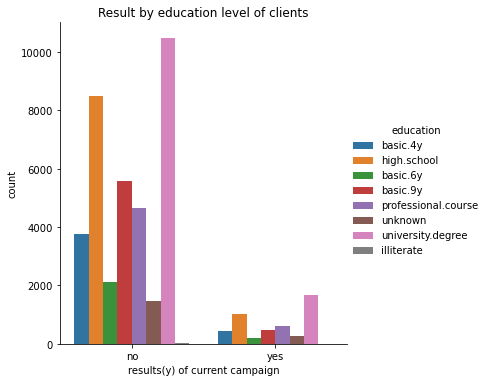

In [10]:
# exploring job type vs current campaign result/outcome
sns.catplot(x="y", hue="education", kind="count", data = bank_df)
plt.title ('Result by education level of clients')
plt.xlabel("results(y) of current campaign")
plt.show ()

In [25]:
bank_df["education"].value_counts(normalize=True)

university.degree      0.295415
high.school            0.231008
basic.9y               0.146809
professional.course    0.127259
basic.4y               0.101418
basic.6y               0.055639
unknown                0.042015
illiterate             0.000437
Name: education, dtype: float64

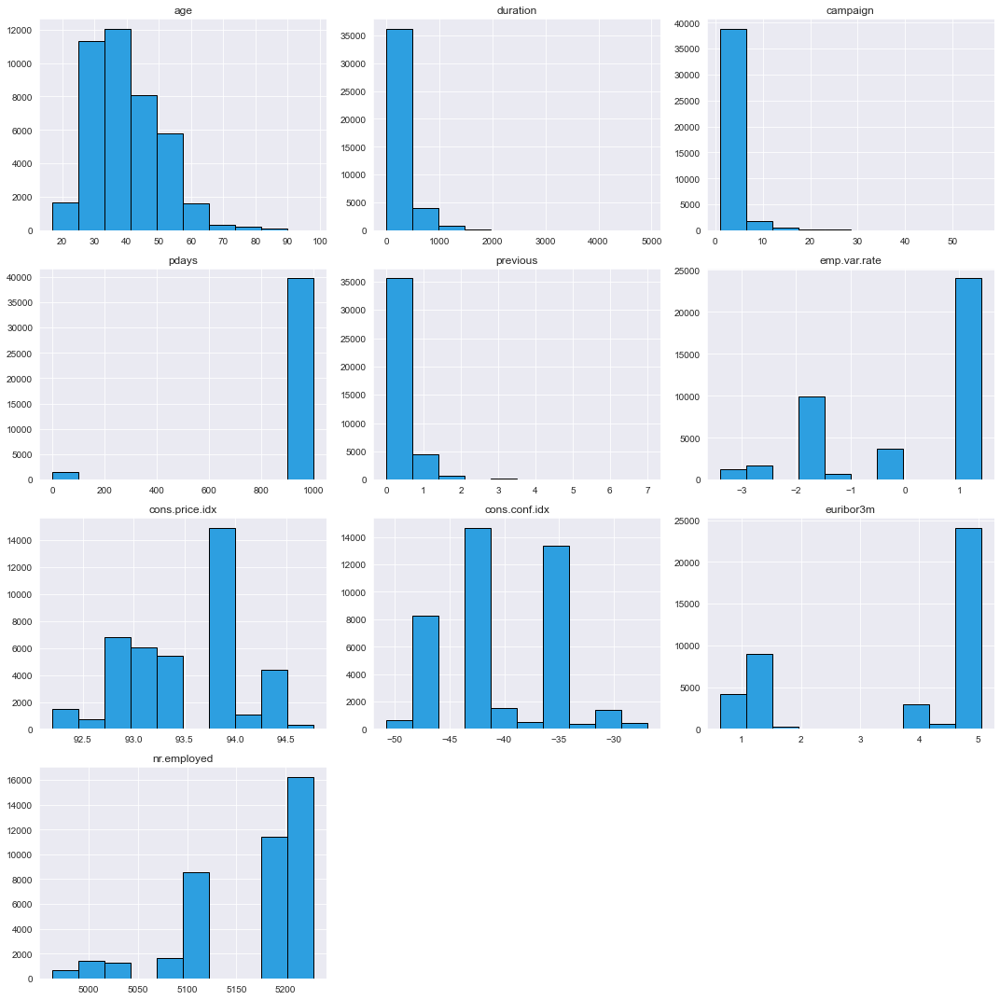

In [48]:
bank_df.hist(figsize=(15,15),edgecolor='k', color='#2d9fe0')
plt.tight_layout()
plt.title ('Numerical Features Distribution')
plt.show()

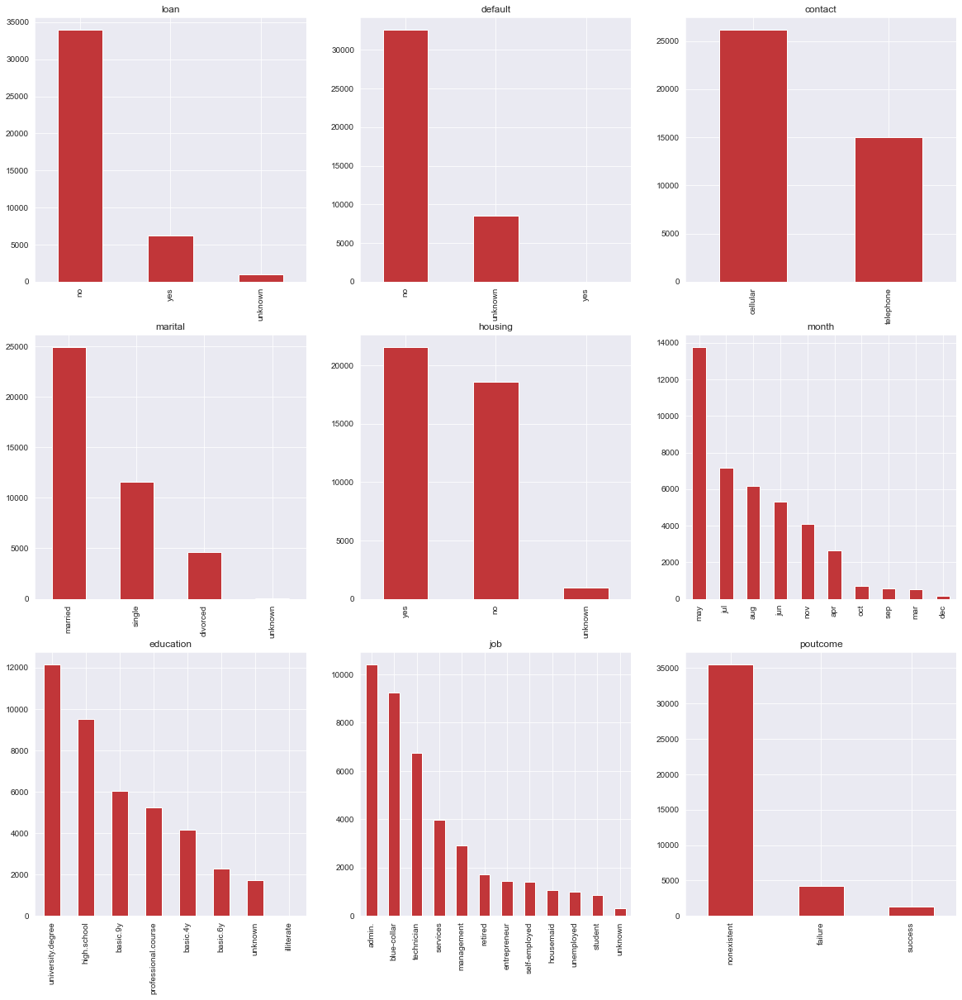

In [90]:
# using bar chart
column_categories = ['loan', 'marital', 'education', 'default', 'housing', 
                     'job', 'contact', 'month', 'poutcome']

# set up the frame for plots
fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(20,20))

# assigning plots of defined categories into the subplots frame
for i, col in enumerate(column_categories):
    row_index = (i % 3) 
    col_index = int(i / 3)
    fig.add_subplot(bank_df[col].value_counts().plot.bar(ax=axes[row_index, col_index], title=col))

Text(0.5, 1.0, 'Education Level')

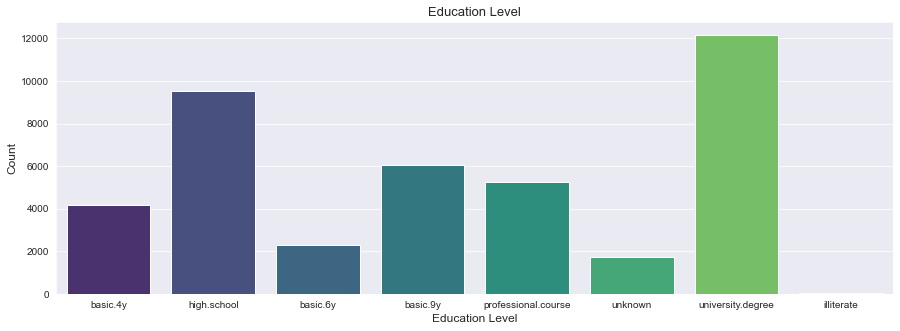

In [69]:
fig, ax = plt.subplots()
fig.set_size_inches(15,5)
sns.countplot(x = "education", data = bank_df, palette='viridis')
ax.set_xlabel('Education Level', fontsize = 12)
ax.set_ylabel('Count', fontsize = 12)
ax.set_title("Education Level", fontsize = 13)

Text(0.5, 1.0, 'Type of Jobs')

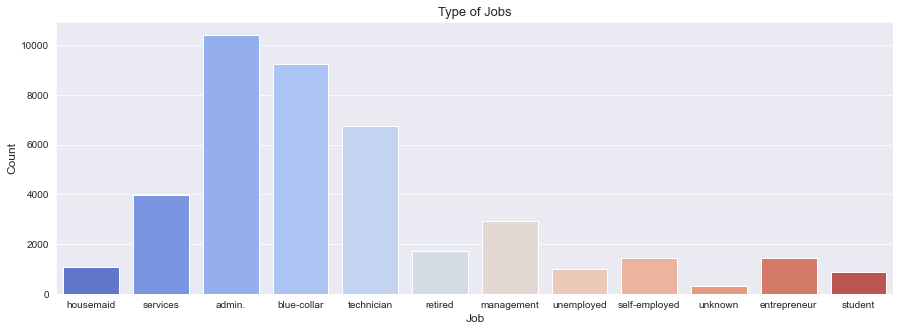

In [62]:
fig, ax = plt.subplots()
fig.set_size_inches(15,5)
sns.countplot(x = "job", data = bank_df, palette='coolwarm')
ax.set_xlabel('Job', fontsize = 12)
ax.set_ylabel('Count', fontsize = 12)
ax.set_title("Type of Jobs", fontsize = 13)

C:\Users\ramdh\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\ramdh\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


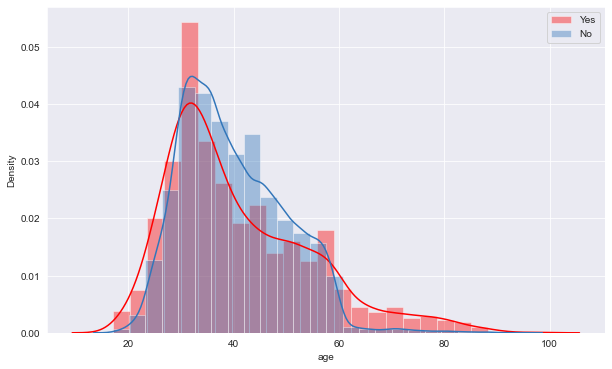

In [89]:
age_target_yes = bank_df[(bank_df['age'] > 0) & (bank_df['y'] == 'yes')]
age_target_no = bank_df[(bank_df['age'] > 0) & (bank_df['y'] == 'no')]

plt.figure(figsize=(10, 6))
sns.distplot(age_target_yes['age'], bins=25, color='r', label='Yes')
sns.distplot(age_target_no['age'], bins=25, color='#3276ba', label='No')
plt.legend()
plt.show()

C:\Users\ramdh\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\ramdh\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


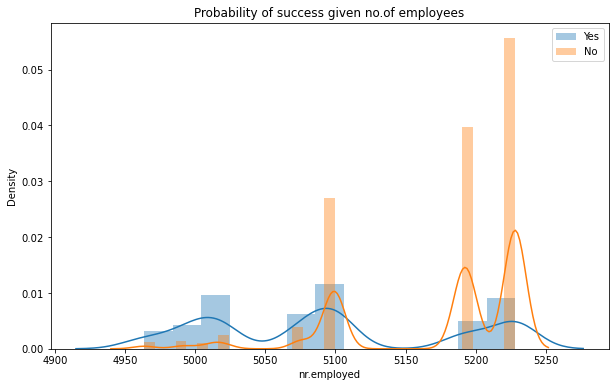

In [31]:
plt.figure(figsize=(10, 6))
g = sns.distplot(bank_df[bank_df['y'] == 'yes']['nr.employed'], label='Yes')
g= sns.distplot(bank_df[bank_df['y'] == 'no']['nr.employed'], label='No')
g.legend()
plt.title ('Probability of success given no.of employees')
plt.show()

C:\Users\ramdh\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\ramdh\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


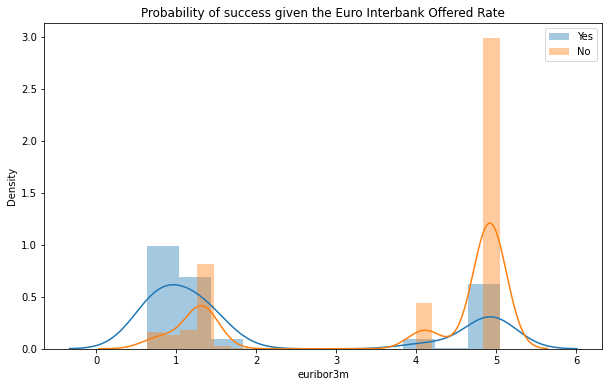

In [32]:
plt.figure(figsize=(10, 6))
g = sns.distplot(bank_df[bank_df['y'] == 'yes']['euribor3m'], label='Yes')
g= sns.distplot(bank_df[bank_df['y'] == 'no']['euribor3m'], label='No')
g.legend()
plt.title ('Probability of success given the Euro Interbank Offered Rate')
plt.show()

C:\Users\ramdh\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\ramdh\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


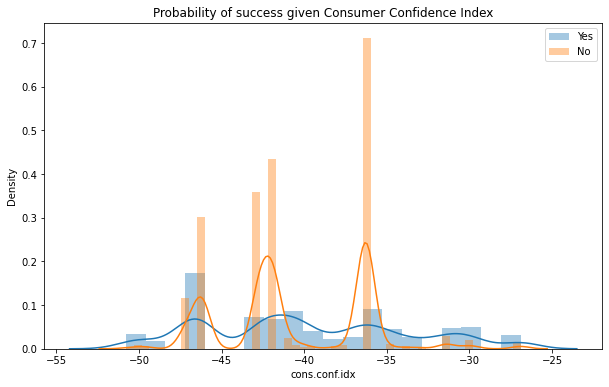

In [33]:
plt.figure(figsize=(10, 6))
g = sns.distplot(bank_df[bank_df['y'] == 'yes']['cons.conf.idx'], label='Yes')
g= sns.distplot(bank_df[bank_df['y'] == 'no']['cons.conf.idx'], label='No')
g.legend()
plt.title ('Probability of success given Consumer Confidence Index')
plt.show()

C:\Users\ramdh\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\ramdh\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


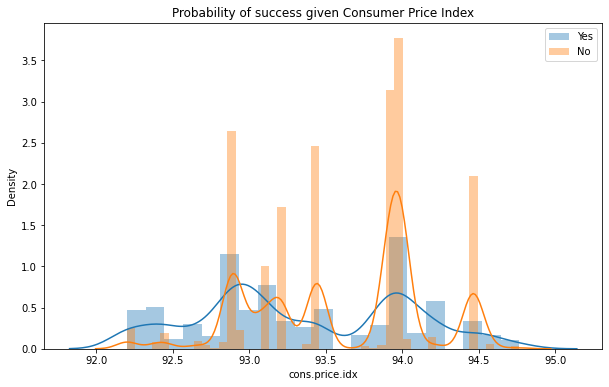

In [37]:
plt.figure(figsize=(10, 6))
g = sns.distplot(bank_df[bank_df['y'] == 'yes']['cons.price.idx'], label='Yes')
g= sns.distplot(bank_df[bank_df['y'] == 'no']['cons.price.idx'], label='No')
g.legend()
plt.title ('Probability of success given Consumer Price Index')
plt.show()

In [41]:
dfgrouped = bank_df.groupby('y')

def feature_perc(feature, groupby= 'yes'):

  count = dfgrouped.get_group(groupby)[feature].value_counts()
  total_count = bank_df[feature].value_counts()[count.index]

  perc = (count/total_count)*100
  return perc 


def plot_barh(array,incrementer, bias,ax= None, text_color ='blue', palette_style = 'darkgrid',palette_color = 'RdBu'):

  sns.set_style(palette_style)
  sns.set_palette(palette_color)
    
  sns.barplot(x= array, y= array.index, ax=ax)
  #plt.barh(array.index, width = array.values, height = .5)
  plt.yticks(np.arange(len(array)))
  plt.xticks( range(0, round(max(array)) +bias, incrementer ))

  for index, value in enumerate(array.values):
    plt.text(value +.5, index, s= '{:.1f}%'.format(value), color = text_color)

  #plt.show()
  return plt

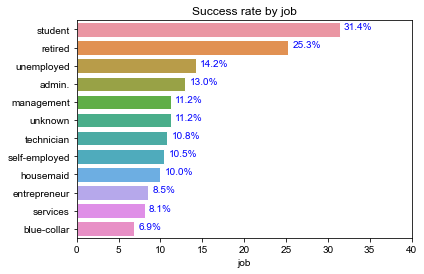

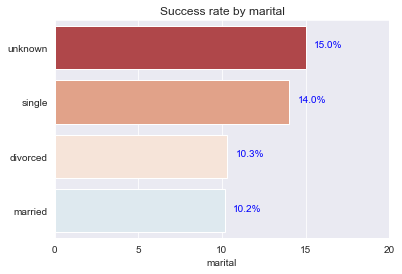

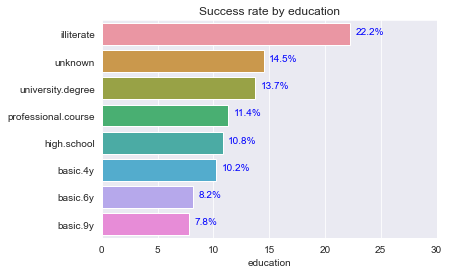

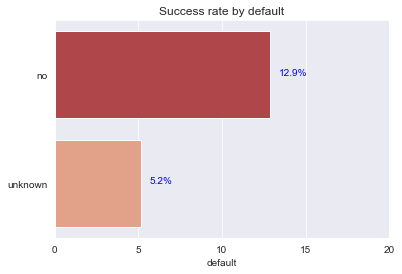

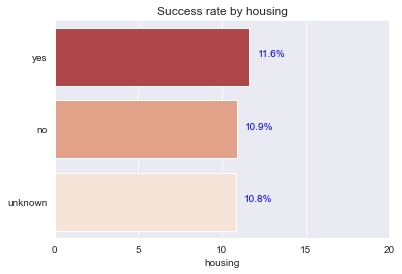

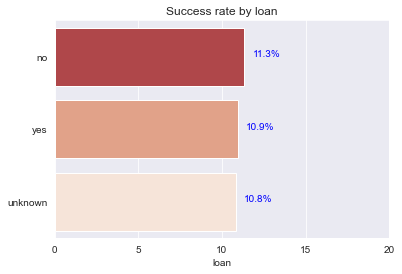

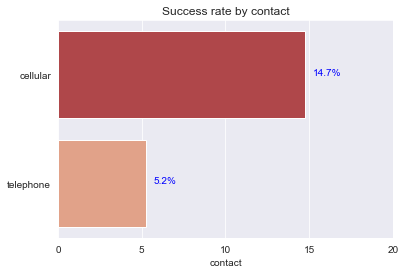

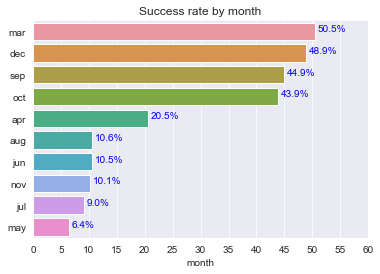

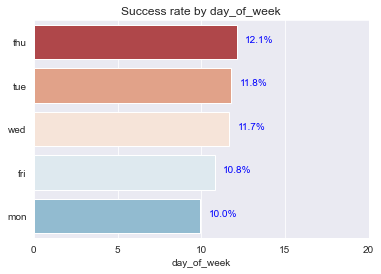

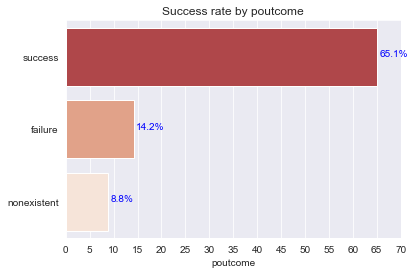

In [42]:
object_features = list(bank_df.dtypes[bank_df.dtypes == 'object'].index)

for feature in object_features[:-1]:
    
    feature_perct =  feature_perc(feature)
    plt.title('Success rate by {}'.format(feature))
    plot_barh(feature_perct.sort_values(ascending= False),5,10, text_color = 'blue')
    plt.show()

In [34]:
cons.price.idx

0   -36.4
1   -36.4
2   -36.4
3   -36.4
4   -36.4
Name: cons.conf.idx, dtype: float64

In [24]:
pp.ProfileReport(bank_df)

In [29]:
profile = pp.ProfileReport(bank_df)
profile.to_file(output_file='Pandas Profiling Report — Bank Marketing Dataset.html')

### Question 1 Ans:


- High correlation between variables: `euribor3m`, `emp.var.rate` and `nr.employed` were found to be highly correlated with each other as shown by the pearson's r correlation matrix. **This means we have multicollinearity issue with these attributes**
- `previous` has 35551 (86.3%) zero
    - The Zero of this attribute provide valuable information. Therefore, this column shouldn't be omitted despite the significant number of zeros
- `pdays` : 96.3% of the data belong to `999` value. 
    - `999` indicates there isn't any valuable information (unknown). This column should be dropped

    
**Imbalanced Data**
   - `job` : Most data points 63.2% are belong to admin, blue-collar, and technician. This could be translated as that this data have biases towards these 3 categories of job.
   - `marital`: 60.5% of the data belong to those who married
   - `default`: 79.1% of the data belong to `no`
   - `y` : 88.7% of the data belong to `no`

### Data Preprocessing

In [91]:
# keeping a copy of original data before dropping
bank_df2 = bank_df.copy()

In [10]:
bank_df.head()

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,duration,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
0,56,housemaid,married,basic.4y,no,no,no,telephone,may,mon,261,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
1,57,services,married,high.school,unknown,no,no,telephone,may,mon,149,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
2,37,services,married,high.school,no,yes,no,telephone,may,mon,226,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
3,40,admin.,married,basic.6y,no,no,no,telephone,may,mon,151,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
4,56,services,married,high.school,no,no,yes,telephone,may,mon,307,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no


In [11]:
# dropping duration column
bank_df.drop(['duration'], inplace=True, axis=1)

# dropping pdays column
bank_df.drop(['pdays'], inplace=True, axis=1)

In [12]:
bank_df.dtypes

age                 int64
job                object
marital            object
education          object
default            object
housing            object
loan               object
contact            object
month              object
day_of_week        object
campaign            int64
previous            int64
poutcome           object
emp.var.rate      float64
cons.price.idx    float64
cons.conf.idx     float64
euribor3m         float64
nr.employed       float64
y                  object
dtype: object

In [13]:
# convert categorical variable to numerical labels
from sklearn.preprocessing import LabelEncoder
LE = LabelEncoder()

categorical_cols = ['job', 'marital', 'education', 'default', 'housing', 
                   'loan', 'contact', 'month', 'day_of_week', 'poutcome', 'y']

for i in categorical_cols:
    bank_df[i] = LE.fit_transform(bank_df[i])
    
bank_df.head()

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,campaign,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
0,56,3,1,0,0,0,0,1,6,1,1,0,1,1.1,93.994,-36.4,4.857,5191.0,0
1,57,7,1,3,1,0,0,1,6,1,1,0,1,1.1,93.994,-36.4,4.857,5191.0,0
2,37,7,1,3,0,2,0,1,6,1,1,0,1,1.1,93.994,-36.4,4.857,5191.0,0
3,40,0,1,1,0,0,0,1,6,1,1,0,1,1.1,93.994,-36.4,4.857,5191.0,0
4,56,7,1,3,0,0,2,1,6,1,1,0,1,1.1,93.994,-36.4,4.857,5191.0,0


In [95]:
bank_df.dtypes

age                 int64
job                 int32
marital             int32
education           int32
default             int32
housing             int32
loan                int32
contact             int32
month               int32
day_of_week         int32
campaign            int64
previous            int64
poutcome            int32
emp.var.rate      float64
cons.price.idx    float64
cons.conf.idx     float64
euribor3m         float64
nr.employed       float64
y                   int32
dtype: object

In [14]:
# splitting the data 
X, y = bank_df.iloc[:,:-1], bank_df.iloc[:, 18]

In [15]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, stratify=y, test_size=0.2)

In [16]:
# import machine learning library to standardize the data
from sklearn.preprocessing import StandardScaler

sc = StandardScaler()
sc.fit_transform(X_train, y_train)
sc.fit(X_test, y_test)

StandardScaler()

Number of mislabeled points out of a total 8236 points : 1843, performance 77.62%


Text(0.5, 24.0, 'Predicted label')

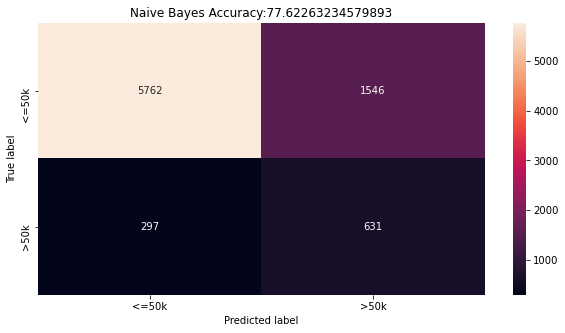

In [19]:
from sklearn.naive_bayes import GaussianNB, BernoulliNB, MultinomialNB
from sklearn.metrics import accuracy_score, confusion_matrix, precision_recall_fscore_support

# Instantiate the classifier
gnb = GaussianNB()
#bnb = BernoulliNB()
#mnb = MultinomialNB()
# Train classifier
gnb.fit(X_train,y_train)
#bnb.fit(x_train,y_train)
#mnb.fit(x_train,y_train)
# Test the classifier
predict = gnb.predict(X_test)
#predict = bnb.predict(x_test)
#predict = mnb.predict(x_test)
# Print results
print("Number of mislabeled points out of a total {} points : {}, performance {:05.2f}%"
.format(X_test.shape[0], (y_test != predict).sum(),
gnb.score(X_test,y_test)*100 ))
# Creates a confusion matrix
cm = confusion_matrix(y_test, predict)
# Transform to dataframe for easier plotting
cm_df = pd.DataFrame(cm, index = ['<=50k','>50k'],
columns = ['<=50k','>50k'])
# plot the confusion matrix
plt.figure(figsize=(10,5))
sns.heatmap(cm_df, annot=True, fmt='g')
plt.title("Naive Bayes Accuracy:" + str(gnb.score(X_test,y_test)*100))
plt.ylabel('True label')
plt.xlabel('Predicted label')

Number of mislabeled points out of a total 8236 points : 1339, performance 77.62%


Text(0.5, 24.0, 'Predicted label')

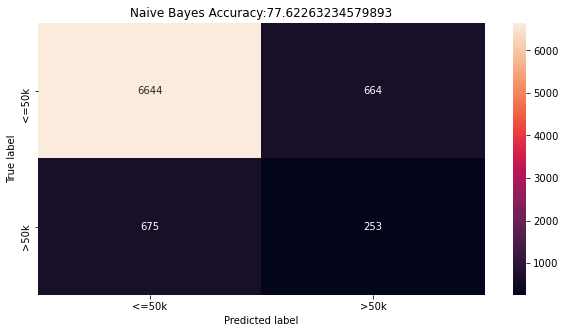

In [21]:
bnb = BernoulliNB()

# Train classifier

bnb.fit(X_train,y_train)
#mnb.fit(x_train,y_train)
# Test the classifier
#predict = gnb.predict(X_test)
predict = bnb.predict(X_test)
#predict = mnb.predict(x_test)
# Print results
print("Number of mislabeled points out of a total {} points : {}, performance {:05.2f}%"
.format(X_test.shape[0], (y_test != predict).sum(),
gnb.score(X_test,y_test)*100 ))
# Creates a confusion matrix
cm = confusion_matrix(y_test, predict)
# Transform to dataframe for easier plotting
cm_df = pd.DataFrame(cm, index = ['<=50k','>50k'],
columns = ['<=50k','>50k'])
# plot the confusion matrix
plt.figure(figsize=(10,5))
sns.heatmap(cm_df, annot=True, fmt='g')
plt.title("Naive Bayes Accuracy:" + str(gnb.score(X_test,y_test)*100))
plt.ylabel('True label')
plt.xlabel('Predicted label')

The prediction accuracy is: 84.18%


Text(0.5, 51.0, 'Predicted label')

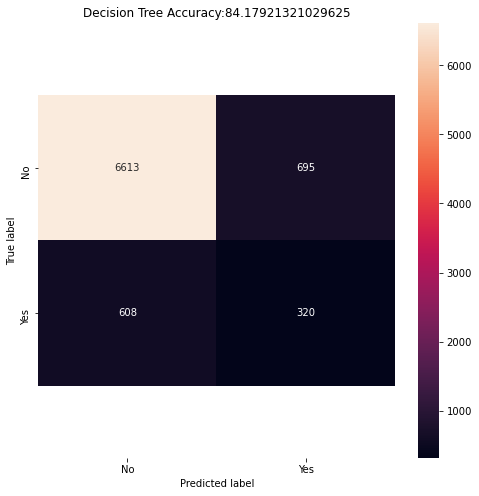

In [25]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score, confusion_matrix, precision_recall_fscore_support

# input decision tree classifier using "gini" & train the model
dtree = DecisionTreeClassifier(random_state=1, criterion='gini').fit(X_train, y_train)

#predict classes of new, unseen data
predict = dtree.predict(X_test)


print("The prediction accuracy is: {0:2.2f}{1:s}".format(dtree.score(X_test,y_test)*100,"%"))

# Creates a confusion matrix
cm = confusion_matrix(y_test, predict)

# Transform to dataframe for easier plotting
cm_df = pd.DataFrame(cm, index = ['No','Yes'],
columns = ['No','Yes'])

# plot the confusion matrix
plt.figure(figsize=(8,8))
ax= sns.heatmap(cm_df, annot=True, fmt='g')
bottom, top = ax.get_ylim()
ax.set_ylim(bottom + 0.5, top - 0.5)
plt.title("Decision Tree Accuracy:" + str(dtree.score(X_test,y_test)*100))
plt.ylabel('True label')
plt.xlabel('Predicted label')

In [27]:
from sklearn.model_selection import cross_val_score

score_dt = cross_val_score(dtree, X_test, predict, cv=5)
print(score_dt)
print("Mean of the cross validation scores:", score_dt.mean())

[0.82342233 0.82817243 0.83242259 0.82088646 0.83545841]
Mean of the cross validation scores: 0.828072444161494


### KNN

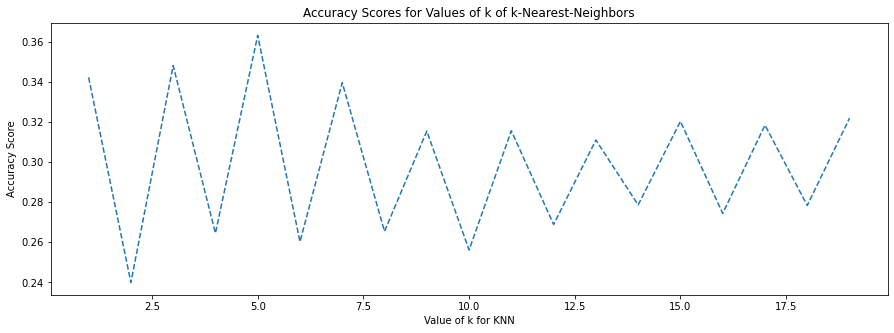

In [30]:
# import KNN model
from sklearn.neighbors import KNeighborsClassifier
# import library for evaluation metrics
from sklearn import metrics

# empty cvariable for storing the KNN metrics
scores = []

# we try different values of k for the KNN (from k=1 until k=26)
lrange=list(range(1,20))

# Loop the KNN process
for k in lrange:
    # input the k value and 'distance' measure
    knn = KNeighborsClassifier(n_neighbors=k)
    
    # input the train data to train KNN
    knn.fit(X_train, y_train)
    
    # see KNN prediction by inputting the test data
    y_pred = knn.predict(X_test)
    
    # append the performance metric (accuracy)
    scores.append(metrics.f1_score(y_test, y_pred))
    
plt.figure(2, figsize=(15, 5))

# plot the result
plt.plot(lrange, scores, ls='dashed')
plt.xlabel('Value of k for KNN')
plt.ylabel('Accuracy Score')
plt.title('Accuracy Scores for Values of k of k-Nearest-Neighbors')
plt.show()

The optimal number of neighbors is 17
The optimal score is 0.89


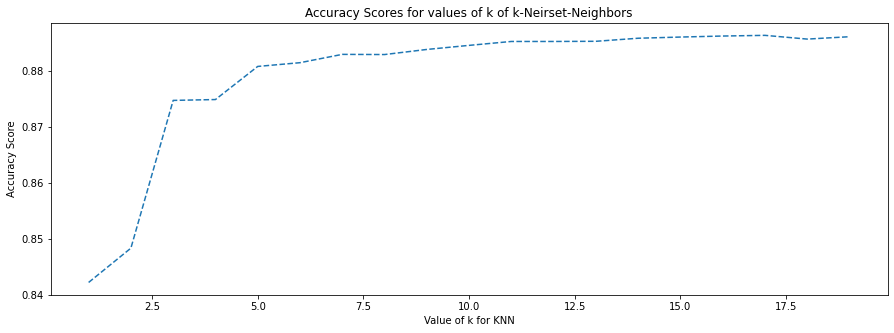

In [32]:
# import library for cross validation scoring
from sklearn.model_selection import cross_val_score

scores = []

lrange=list(range(1,20))

for k in lrange:
    # input the value of k and distance measure
    knn = KNeighborsClassifier(n_neighbors=k, weights='distance', algorithm='auto')
    # get score for the 10 fold cross validation
    score = cross_val_score(knn, X_train, y_train, cv=10, scoring='accuracy')
    scores.append(score.mean())
    
optimal_k = lrange[scores.index(max(scores))]
print("The optimal number of neighbors is %d" % optimal_k)
print("The optimal score is %.2f" % max(scores))

plt.figure(2, figsize=(15,5))

# plot the result
plt.plot(lrange, scores, ls='dashed')
plt.xlabel('Value of k for KNN')
plt.ylabel('Accuracy Score')
plt.title('Accuracy Scores for values of k of k-Neirset-Neighbors')
plt.show()

### Question 2 Ans:

Accuracy Scores:
- Gaussian and Bernoulli Bayes : 76.2%
- Decision Tree:  84.18% 
- KNN(k=17) : 89%

KNN was the best performing algorithm!